# Rural Real Estate Valuations and Income Levels

### You work for a resort development company, and have been tasked to determine where within the United States the next destination should be placed.  Considerations should be made for land valuation costs & local incomes with our services being discretionary.  

### Our goal should be to obtain the areas within the United States that offer the highest average discretionary incomes while maintaining lower than average land costs.  

### Data utilized includes:

### Income data obtained from the US Census Bureau:  https://data.census.gov/cedsci/table?q=median%20income&g=0100000US.860000&tid=ACSST5Y2019.S1901&hidePreview=true

### Land values obtained from American Enterprise Institute:  https://www.aei.org/housing/land-price-indicators/

### Import Libraries.

In [2]:
import numpy as np 
import pandas as pd 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import csv

!pip install geocoder
import geocoder

import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import seaborn as sns; sns.set()
import csv
from pandas.io.json import json_normalize 

print('Libraries Installed.')

Libraries Installed.


In [3]:
import json 
!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim 
import requests 

print('Libraries Installed.')

Solving environment: ...working... done

# All requested packages already installed.

Libraries Installed.


In [4]:
import matplotlib.cm as cm
import matplotlib.colors as colors
from sklearn.cluster import KMeans
!conda install -c conda-forge folium=0.5.0 --yes 
import folium 

print('Libraries Installed.')

Solving environment: ...working... done

# All requested packages already installed.

Libraries Installed.


### Let us determine income levels by zip code.  A dataset was located online utilizing US Census data.


#### Import the downloaded CSV.

In [5]:
income_data = pd.read_csv(r"C:\Users\darat\Desktop\Coursera\IBM DATA SCIENCE\CapStone\Week4\median_income_by_zip.csv")
income_data.head(5)
    

,GEO_ID,NAME,S1901_C01_008M,Median Annual Income,Average Annual Income
0,id,Geographic Area Name,"Margin of Error!!Households!!Total!!$75,000 to...",Estimate!!Households!!Median income (dollars),Estimate!!Households!!Mean income (dollars)
1,8600000US35004,ZCTA5 35004,3.9,62902,71145
2,8600000US35005,ZCTA5 35005,3.1,50473,60551
3,8600000US35006,ZCTA5 35006,5.3,55909,72128
4,8600000US35007,ZCTA5 35007,2.8,73587,81551


#### This dataset has an unnecessary header in row 0.  Dropping that row.  

In [6]:
income_data.drop(income_data.index[0], inplace=True)
income_data.head(5)

,GEO_ID,NAME,S1901_C01_008M,Median Annual Income,Average Annual Income
1,8600000US35004,ZCTA5 35004,3.9,62902,71145
2,8600000US35005,ZCTA5 35005,3.1,50473,60551
3,8600000US35006,ZCTA5 35006,5.3,55909,72128
4,8600000US35007,ZCTA5 35007,2.8,73587,81551
5,8600000US35010,ZCTA5 35010,2.1,41954,59677


#### Dropped first column as well, which was a location string ending in zip.  Zip also appearing within Name column.

In [7]:
income_data.drop("GEO_ID" , axis=1 , inplace=True)
income_data.head(5)

,NAME,S1901_C01_008M,Median Annual Income,Average Annual Income
1,ZCTA5 35004,3.9,62902,71145
2,ZCTA5 35005,3.1,50473,60551
3,ZCTA5 35006,5.3,55909,72128
4,ZCTA5 35007,2.8,73587,81551
5,ZCTA5 35010,2.1,41954,59677


#### We will drop the first characters from the Name column to extract the zip codes.

In [8]:
zip_update = income_data
zip_update.head(5)

,NAME,S1901_C01_008M,Median Annual Income,Average Annual Income
1,ZCTA5 35004,3.9,62902,71145
2,ZCTA5 35005,3.1,50473,60551
3,ZCTA5 35006,5.3,55909,72128
4,ZCTA5 35007,2.8,73587,81551
5,ZCTA5 35010,2.1,41954,59677


In [9]:
zip_update['NAME'] = zip_update['NAME'].str[5:]
zip_update.head(5)

,NAME,S1901_C01_008M,Median Annual Income,Average Annual Income
1,35004,3.9,62902,71145
2,35005,3.1,50473,60551
3,35006,5.3,55909,72128
4,35007,2.8,73587,81551
5,35010,2.1,41954,59677


#### The second column is unnecessary, I'm looking for the Median & Mean incomes.

In [10]:
zip_update.drop("S1901_C01_008M" , axis=1 , inplace=True)
zip_update.head(5)

,NAME,Median Annual Income,Average Annual Income
1,35004,62902,71145
2,35005,50473,60551
3,35006,55909,72128
4,35007,73587,81551
5,35010,41954,59677


In [11]:
zip_update.rename(columns={"NAME" : "ZIPCode"}, inplace=True)
zip_update.head(5)

,ZIPCode,Median Annual Income,Average Annual Income
1,35004,62902,71145
2,35005,50473,60551
3,35006,55909,72128
4,35007,73587,81551
5,35010,41954,59677


## Let us determine property values by zip code. A dataset was located online data from American Enterprise Institute.

In [12]:
land_data = pd.read_csv(r"C:\Users\darat\Desktop\Coursera\IBM DATA SCIENCE\CapStone\Week4\land_value_by_zip_2019.csv")
land_data.head(15)

C:\Users\darat\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3146: DtypeWarning: Columns (7) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


,ZIP Code,Year,"Land Value (Per Acre, As-Is)","Land Value (1/4 Acre Lot, Standardized)",Land Share of Property Value,Home Price Appreciation (HPA),Unnamed: 6,Unnamed: 7
0,1001,2012,180800.0,72800.0,42.4%,100.0%,NaN,"** NOTE: For some mostly smaller ZIP Codes, we..."
1,1001,2013,186200.0,75000.0,42.6%,102.6%,NaN,NaN
2,1001,2014,186700.0,75200.0,41.7%,105.0%,NaN,NaN
3,1001,2015,199600.0,80400.0,42.9%,109.0%,NaN,NaN
4,1001,2016,205200.0,82600.0,43.6%,110.5%,NaN,NaN
5,1001,2017,223000.0,89800.0,45.2%,115.6%,NaN,NaN
6,1001,2018,236600.0,95300.0,45.8%,121.1%,NaN,NaN
7,1001,2019,245700.0,98900.0,46.1%,125.0%,NaN,NaN
8,1002,2012,190300.0,108100.0,44.7%,100.0%,NaN,NaN
9,1002,2013,205100.0,116500.0,46.0%,104.7%,NaN,NaN


#### We are focused on most recent data.  Reducing years to 2019.

In [13]:
yr2019 = land_data.loc[(land_data['Year']== 2019)]
yr2019.head(5)

,ZIP Code,Year,"Land Value (Per Acre, As-Is)","Land Value (1/4 Acre Lot, Standardized)",Land Share of Property Value,Home Price Appreciation (HPA),Unnamed: 6,Unnamed: 7
7,1001,2019,245700.0,98900.0,46.1%,125.0%,NaN,NaN
15,1002,2019,244800.0,139000.0,47.1%,122.1%,NaN,NaN
23,1005,2019,90100.0,68200.0,38.8%,157.6%,NaN,NaN
31,1007,2019,101700.0,85000.0,38.5%,122.9%,NaN,NaN
39,1010,2019,95100.0,80100.0,38.1%,133.9%,NaN,NaN


In [14]:
yr2019.drop("Unnamed: 6" ,  axis=1 , inplace=True)
yr2019.drop("Unnamed: 7" ,  axis=1 , inplace=True)

C:\Users\darat\anaconda3\lib\site-packages\pandas\core\frame.py:4163: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [15]:
yr2019.head(5)

,ZIP Code,Year,"Land Value (Per Acre, As-Is)","Land Value (1/4 Acre Lot, Standardized)",Land Share of Property Value,Home Price Appreciation (HPA)
7,1001,2019,245700.0,98900.0,46.1%,125.0%
15,1002,2019,244800.0,139000.0,47.1%,122.1%
23,1005,2019,90100.0,68200.0,38.8%,157.6%
31,1007,2019,101700.0,85000.0,38.5%,122.9%
39,1010,2019,95100.0,80100.0,38.1%,133.9%


#### Renaming the Zip Code Column

In [16]:
yr2019 = yr2019.rename(columns={"ZIP Code": "ZIPCode"})
yr2019.head(5)

,ZIPCode,Year,"Land Value (Per Acre, As-Is)","Land Value (1/4 Acre Lot, Standardized)",Land Share of Property Value,Home Price Appreciation (HPA)
7,1001,2019,245700.0,98900.0,46.1%,125.0%
15,1002,2019,244800.0,139000.0,47.1%,122.1%
23,1005,2019,90100.0,68200.0,38.8%,157.6%
31,1007,2019,101700.0,85000.0,38.5%,122.9%
39,1010,2019,95100.0,80100.0,38.1%,133.9%


#### Our zip codes lost their leading zeros.  Setting Zip Code to string.

In [17]:
yr2019["ZIPCode"] = yr2019["ZIPCode"].astype(str)
yr2019.head(5)

,ZIPCode,Year,"Land Value (Per Acre, As-Is)","Land Value (1/4 Acre Lot, Standardized)",Land Share of Property Value,Home Price Appreciation (HPA)
7,1001,2019,245700.0,98900.0,46.1%,125.0%
15,1002,2019,244800.0,139000.0,47.1%,122.1%
23,1005,2019,90100.0,68200.0,38.8%,157.6%
31,1007,2019,101700.0,85000.0,38.5%,122.9%
39,1010,2019,95100.0,80100.0,38.1%,133.9%


#### Adding leading zeros to the Zip Codes with zfill.

In [18]:
yr2019["ZIPCode"]= yr2019["ZIPCode"].str.zfill(5)
yr2019.head(5)

,ZIPCode,Year,"Land Value (Per Acre, As-Is)","Land Value (1/4 Acre Lot, Standardized)",Land Share of Property Value,Home Price Appreciation (HPA)
7,01001,2019,245700.0,98900.0,46.1%,125.0%
15,01002,2019,244800.0,139000.0,47.1%,122.1%
23,01005,2019,90100.0,68200.0,38.8%,157.6%
31,01007,2019,101700.0,85000.0,38.5%,122.9%
39,01010,2019,95100.0,80100.0,38.1%,133.9%


#### Renaming dataframes & sorting by ZIPCode for better understanding.  

In [24]:
income_zip = zip_update
income_zip.sort_values(by=['ZIPCode'], ascending=True)
income_zip.head(15)

,ZIPCode,Median Annual Income,Average Annual Income
1,35004,62902,71145
2,35005,50473,60551
3,35006,55909,72128
4,35007,73587,81551
5,35010,41954,59677
6,35013,-,-
7,35014,47691,61802
8,35016,46157,65972
9,35019,38080,56962
10,35020,29133,41031


In [25]:
value_zip = yr2019
value_zip.sort_values(by=['ZIPCode'], ascending=True)
value_zip.head(15)

,ZIPCode,Year,"Land Value (Per Acre, As-Is)","Land Value (1/4 Acre Lot, Standardized)",Land Share of Property Value,Home Price Appreciation (HPA)
7,01001,2019,245700.0,98900.0,46.1%,125.0%
15,01002,2019,244800.0,139000.0,47.1%,122.1%
23,01005,2019,90100.0,68200.0,38.8%,157.6%
31,01007,2019,101700.0,85000.0,38.5%,122.9%
39,01010,2019,95100.0,80100.0,38.1%,133.9%
47,01013,2019,353000.0,84400.0,41.7%,134.3%
55,01020,2019,275900.0,77600.0,40.2%,128.1%
63,01027,2019,234500.0,109500.0,43.9%,129.7%
71,01028,2019,193900.0,91400.0,40.5%,121.3%
79,01030,2019,234300.0,99300.0,45.5%,123.4%


### Merge function is not properly migrating.

#### The merge issue appears to be due to the ZIPCode containing whitespace within the income dataframe.

In [26]:
df_combined = pd.merge(income_zip, value_zip, how='inner', on='ZIPCode')
df_combined.head(10)

,ZIPCode,Median Annual Income,Average Annual Income,Year,"Land Value (Per Acre, As-Is)","Land Value (1/4 Acre Lot, Standardized)",Land Share of Property Value,Home Price Appreciation (HPA)


#### Converting the dataframes to common types, string.  

In [27]:
income_zip = income_zip.astype(str)
income_zip.head(5)

,ZIPCode,Median Annual Income,Average Annual Income
1,35004,62902,71145
2,35005,50473,60551
3,35006,55909,72128
4,35007,73587,81551
5,35010,41954,59677


In [28]:
value_zip = value_zip.astype(str)
value_zip.head(5)

,ZIPCode,Year,"Land Value (Per Acre, As-Is)","Land Value (1/4 Acre Lot, Standardized)",Land Share of Property Value,Home Price Appreciation (HPA)
7,01001,2019,245700.0,98900.0,46.1%,125.0%
15,01002,2019,244800.0,139000.0,47.1%,122.1%
23,01005,2019,90100.0,68200.0,38.8%,157.6%
31,01007,2019,101700.0,85000.0,38.5%,122.9%
39,01010,2019,95100.0,80100.0,38.1%,133.9%


#### Stripping the whitespace from the income dataframe.  

In [29]:
new = pd.Series([])
new = income_zip['ZIPCode']
new.astype(str)
new = income_zip['ZIPCode'].str.strip()
income_zip['ZIPCode'] = new
income_zip.head(5)

<ipython-input-29-801389955573>:1: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new = pd.Series([])


,ZIPCode,Median Annual Income,Average Annual Income
1,35004,62902,71145
2,35005,50473,60551
3,35006,55909,72128
4,35007,73587,81551
5,35010,41954,59677


#### The income ZIP is now 5 digits, matching the value ZIP length.  

In [30]:
income_zip["ZIPCode"].str.len()

1        5
2        5
3        5
4        5
5        5
6        5
7        5
8        5
9        5
10       5
11       5
12       5
13       5
14       5
15       5
16       5
17       5
18       5
19       5
20       5
21       5
22       5
23       5
24       5
25       5
26       5
27       5
28       5
29       5
30       5
31       5
32       5
33       5
34       5
35       5
36       5
37       5
38       5
39       5
40       5
41       5
42       5
43       5
44       5
45       5
46       5
47       5
48       5
49       5
50       5
51       5
52       5
53       5
54       5
55       5
56       5
57       5
58       5
59       5
60       5
61       5
62       5
63       5
64       5
65       5
66       5
67       5
68       5
69       5
70       5
71       5
72       5
73       5
74       5
75       5
76       5
77       5
78       5
79       5
80       5
81       5
82       5
83       5
84       5
85       5
86       5
87       5
88       5
89       5
90       5
91       5

In [31]:
value_zip["ZIPCode"].str.len()

7         5
15        5
23        5
31        5
39        5
47        5
55        5
63        5
71        5
79        5
87        5
95        5
103       5
111       5
119       5
127       5
135       5
143       5
151       5
159       5
167       5
175       5
183       5
191       5
199       5
207       5
215       5
223       5
231       5
239       5
247       5
255       5
263       5
271       5
279       5
287       5
295       5
303       5
311       5
319       5
327       5
335       5
343       5
351       5
359       5
367       5
375       5
383       5
391       5
399       5
407       5
415       5
423       5
431       5
439       5
447       5
455       5
463       5
471       5
479       5
487       5
495       5
503       5
511       5
519       5
527       5
535       5
543       5
551       5
559       5
567       5
575       5
583       5
591       5
599       5
607       5
615       5
623       5
631       5
639       5
647       5
655       5
663       5
671 

### Merge function now properly merges dataframes.

In [32]:
df = pd.merge(income_zip, value_zip, how='inner', on=['ZIPCode', 'ZIPCode'])
df.head(5)

,ZIPCode,Median Annual Income,Average Annual Income,Year,"Land Value (Per Acre, As-Is)","Land Value (1/4 Acre Lot, Standardized)",Land Share of Property Value,Home Price Appreciation (HPA)
0,35004,62902,71145,2019,82700.0,36000.0,23.5%,127.6%
1,35005,50473,60551,2019,38100.0,17200.0,22.5%,118.5%
2,35006,55909,72128,2019,35400.0,23100.0,27.6%,120.0%
3,35007,73587,81551,2019,118400.0,45500.0,24.9%,130.9%
4,35010,41954,59677,2019,339900.0,271100.0,39.6%,123.2%


### Renaming Land Columns

In [33]:
df = df.rename(columns={"Land Value (Per Acre, As-Is)": "Land Value" , "Land Value (1/4 Acre Lot, Standardized)": "1/4 Acre" })
df.head(5)

,ZIPCode,Median Annual Income,Average Annual Income,Year,Land Value,1/4 Acre,Land Share of Property Value,Home Price Appreciation (HPA)
0,35004,62902,71145,2019,82700.0,36000.0,23.5%,127.6%
1,35005,50473,60551,2019,38100.0,17200.0,22.5%,118.5%
2,35006,55909,72128,2019,35400.0,23100.0,27.6%,120.0%
3,35007,73587,81551,2019,118400.0,45500.0,24.9%,130.9%
4,35010,41954,59677,2019,339900.0,271100.0,39.6%,123.2%


### Replacing "-" values with NaN

In [34]:
df['Median Annual Income' ].replace('-', np.nan, inplace=True)
df['Average Annual Income' ].replace('-', np.nan, inplace=True)

In [35]:
print(df.describe())

       ZIPCode Median Annual Income Average Annual Income   Year Land Value  \
count    18455                18371                 18450  18455      18455   
unique   18455                15379                 16653      1       7732   
top      45230                62500                     N   2019        nan   
freq         1                   18                    10  18455        631   

       1/4 Acre Land Share of Property Value Home Price Appreciation (HPA)  
count     18455                        18455                         18455  
unique     4235                          860                          1362  
top         nan                        41.7%                        130.9%  
freq        631                           70                            55  


### Dropping the NaN values

In [36]:
df.dropna(how='any', inplace=True)

In [37]:
df['Median Annual Income'] = df['Median Annual Income'].astype(float)

ValueError: could not convert string to float: '250,000+'

### Replacing the string value so that the values may be converted to floats

In [38]:
df['Median Annual Income' ].replace('250,000+', np.nan, inplace=True)

In [39]:
df.dropna(how='any', inplace=True)

### Converting the values to floats

In [40]:
df['Median Annual Income'] = df['Median Annual Income'].astype(float)

In [41]:
df['Average Annual Income'] = df['Average Annual Income'].astype(float)

In [42]:
df['Land Value'] = df['Land Value'].astype(float)

In [43]:
df['1/4 Acre'] = df['1/4 Acre'].astype(float)

### Creating a new column evaluating Acre Value by Average Local Income 

In [44]:
df['Acre/Income'] = df['Land Value'] / df['Average Annual Income']
df.head(5)

,ZIPCode,Median Annual Income,Average Annual Income,Year,Land Value,1/4 Acre,Land Share of Property Value,Home Price Appreciation (HPA),Acre/Income
0,35004,62902.0,71145.0,2019,82700.0,36000.0,23.5%,127.6%,1.162415
1,35005,50473.0,60551.0,2019,38100.0,17200.0,22.5%,118.5%,0.629222
2,35006,55909.0,72128.0,2019,35400.0,23100.0,27.6%,120.0%,0.490794
3,35007,73587.0,81551.0,2019,118400.0,45500.0,24.9%,130.9%,1.451852
4,35010,41954.0,59677.0,2019,339900.0,271100.0,39.6%,123.2%,5.695662


In [45]:
df.describe()

,Median Annual Income,Average Annual Income,Land Value,1/4 Acre,Acre/Income
count,18361.000000,18361.000000,1.774800e+04,1.774800e+04,17748.000000
mean,67872.067262,87344.534611,6.300569e+05,1.492417e+05,6.197508
std,27689.755229,36934.527569,2.448822e+06,3.483431e+05,17.186260
min,13574.000000,22014.000000,-5.520000e+04,-2.170000e+04,-0.656598
25%,49529.000000,63837.000000,7.970000e+04,4.030000e+04,1.060082
50%,61797.000000,77799.000000,1.686500e+05,7.225000e+04,2.064087
75%,79667.000000,99542.000000,4.458250e+05,1.463000e+05,5.187595
max,248243.000000,416225.000000,1.069093e+08,1.337550e+07,562.323054


### Sort by our new column

In [46]:
df.sort_values(by='Acre/Income')

,ZIPCode,Median Annual Income,Average Annual Income,Year,Land Value,1/4 Acre,Land Share of Property Value,Home Price Appreciation (HPA),Acre/Income
9553,69162,54227.0,67469.0,2019,-44300.0,-11000.0,-11.6%,89.3%,-0.656598
4862,61361,60250.0,73957.0,2019,-40900.0,-15900.0,-24.4%,75.8%,-0.553024
12282,58656,94632.0,100347.0,2019,-54700.0,-18100.0,-9.7%,90.1%,-0.545108
12269,58523,90000.0,103618.0,2019,-55200.0,-17000.0,-10.0%,114.2%,-0.532726
14887,29911,35139.0,53368.0,2019,-24400.0,-21700.0,-28.0%,71.1%,-0.457203
12237,58032,60313.0,79842.0,2019,-34700.0,-10900.0,-14.9%,94.6%,-0.434608
18312,54736,54091.0,71795.0,2019,-25800.0,-12600.0,-15.1%,77.5%,-0.359357
11362,13661,71750.0,82727.0,2019,-28600.0,-18300.0,-19.9%,67.1%,-0.345715
5136,62902,45164.0,66797.0,2019,-20400.0,-11500.0,-9.9%,90.3%,-0.305403
13772,15722,56420.0,67547.0,2019,-19900.0,-8000.0,-8.9%,86.6%,-0.294610


### Filtering out negative values and retrieving the top 50% of Average Incomes

In [47]:
filter_df = df[(df['Land Value'] > 0) & (df['Average Annual Income'] > 78126) ]

In [48]:
filter_df.describe()

,Median Annual Income,Average Annual Income,Land Value,1/4 Acre,Acre/Income
count,8864.000000,8864.000000,8.864000e+03,8.864000e+03,8864.000000
mean,86902.853903,111956.276850,9.852408e+05,2.233247e+05,7.940652
std,26616.523398,37097.119591,3.363312e+06,4.699412e+05,21.738134
min,29722.000000,78127.000000,4.000000e+02,3.000000e+02,0.004970
25%,68916.500000,86864.750000,1.239750e+05,6.250000e+04,1.239711
50%,79833.500000,99806.500000,2.768000e+05,1.116000e+05,2.527049
75%,97615.250000,124212.750000,7.368750e+05,2.262000e+05,6.567448
max,248243.000000,383127.000000,1.069093e+08,1.337550e+07,562.323054


### Here are the top 50 zip codes, sorted by most affordable land by largest Average Annual Incomes

In [49]:
top_zips = filter_df.sort_values(by='Acre/Income')
top_zips.head(50)

,ZIPCode,Median Annual Income,Average Annual Income,Year,Land Value,1/4 Acre,Land Share of Property Value,Home Price Appreciation (HPA),Acre/Income
16165,77831,50090.0,80487.0,2019,400.0,300.0,0.4%,111.2%,0.004970
5981,66535,70566.0,81813.0,2019,2600.0,1400.0,1.1%,103.9%,0.031780
6259,42082,65212.0,85555.0,2019,2800.0,2200.0,2.3%,107.0%,0.032727
8857,39170,61268.0,85119.0,2019,2800.0,1600.0,2.5%,110.4%,0.032895
10974,12070,53203.0,86246.0,2019,3500.0,1900.0,1.7%,103.2%,0.040582
5081,62544,71713.0,87812.0,2019,5100.0,2000.0,1.9%,86.6%,0.058079
4924,61742,94044.0,106317.0,2019,8400.0,3500.0,2.4%,93.1%,0.079009
14244,18328,62785.0,79344.0,2019,7000.0,5000.0,4.3%,96.8%,0.088223
4878,61517,78636.0,111829.0,2019,11800.0,7700.0,8.1%,92.4%,0.105518
12920,45380,73609.0,91458.0,2019,10000.0,5000.0,4.1%,112.2%,0.109340


### Splitting the top 250 zip codes from the remaining dataset

In [52]:
top_250 = top_zips.iloc[:250,:]
top_rest = top_zips.iloc[251:,:]

### Here are our top 250 zip codes

In [53]:
top_250

,ZIPCode,Median Annual Income,Average Annual Income,Year,Land Value,1/4 Acre,Land Share of Property Value,Home Price Appreciation (HPA),Acre/Income
16165,77831,50090.0,80487.0,2019,400.0,300.0,0.4%,111.2%,0.004970
5981,66535,70566.0,81813.0,2019,2600.0,1400.0,1.1%,103.9%,0.031780
6259,42082,65212.0,85555.0,2019,2800.0,2200.0,2.3%,107.0%,0.032727
8857,39170,61268.0,85119.0,2019,2800.0,1600.0,2.5%,110.4%,0.032895
10974,12070,53203.0,86246.0,2019,3500.0,1900.0,1.7%,103.2%,0.040582
5081,62544,71713.0,87812.0,2019,5100.0,2000.0,1.9%,86.6%,0.058079
4924,61742,94044.0,106317.0,2019,8400.0,3500.0,2.4%,93.1%,0.079009
14244,18328,62785.0,79344.0,2019,7000.0,5000.0,4.3%,96.8%,0.088223
4878,61517,78636.0,111829.0,2019,11800.0,7700.0,8.1%,92.4%,0.105518
12920,45380,73609.0,91458.0,2019,10000.0,5000.0,4.1%,112.2%,0.109340


#### Obtain the Latitude & Longitude for these top 250 zip codes 

In [54]:
latitude=[]
longitude=[]
for code in top_250['ZIPCode']:
    g = geocoder.arcgis('{}, United States'.format(code))
    print(code, g.latlng)
    while (g.latlng is None):
        g = geocoder.arcgis('{}, United States'.format(code))
        print(code, g.latlng)
    latlng = g.latlng
    latitude.append(latlng[0])
    longitude.append(latlng[1])

77831 [30.773570000000063, -95.95043999999996]
66535 [39.194420500000035, -96.42129999999997]
42082 [36.91548460000007, -88.52073509999997]
39170 [32.09706500000004, -90.29860999999994]
12070 [42.95670000000007, -74.23259999999993]
62544 [39.70966500000003, -89.00040999999999]
61742 [40.63134500000007, -89.27643499999994]
18328 [41.25775950000008, -74.91102679999995]
61517 [40.83977500000003, -89.88618499999995]
45380 [40.22223500000007, -84.48438999999996]
05262 [42.94728440000006, -73.21117249999998]
62520 [39.79696590000003, -89.48808189999994]
12029 [42.39638020000007, -73.41495479999998]
39325 [32.48339500000003, -88.83435999999995]
18615 [41.45706000000007, -75.86106499999994]
99712 [64.89138800000006, -147.68064029999996]
05250 [43.07175890000008, -73.15535869999997]
61525 [40.85730500000005, -89.67820629999994]
72135 [34.90341500000005, -92.50081999999998]
77880 [30.33182000000005, -96.16329999999994]
73527 [34.63202000000007, -98.62786429999994]
12746 [41.419354300000066, -74.

52746 [41.69558500000005, -90.67464999999999]
12121 [42.84500730000008, -73.62060579999996]
47126 [38.54243440000005, -85.76870839999998]
04351 [44.32706500000006, -69.86772279999997]
12137 [42.826725700000054, -74.13912479999993]
70563 [30.00827000000004, -91.80529999999999]
05255 [43.17253910000005, -73.05316729999998]
10973 [41.394244300000025, -74.47944999999999]
13303 [43.30127340000007, -75.44641599999994]
54101 [44.77935000000008, -88.05813499999994]
61284 [41.38701000000003, -90.76355979999994]
44040 [41.51932500000004, -81.40327999999994]
70711 [30.504255000000057, -90.58559499999996]
38345 [35.64596670000003, -88.54971859999995]
06254 [41.61319190000006, -72.11808169999995]
42001 [37.088055000000054, -88.60889999999995]
27233 [35.887508800000035, -79.68552819999996]
47638 [38.10265990000005, -87.78821729999999]
43009 [40.168191800000045, -83.62934989999997]
12033 [42.53160820000005, -73.75070269999998]
28676 [36.31898550000005, -80.85676389999998]
05346 [42.97129000000007, -7

### Append the Latitude & Longitude to the dataframe

In [55]:
top_250['Latitude'] = latitude
top_250['Longitude'] = longitude
top_250.head(5)

<ipython-input-55-46befe9cbc4a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_250['Latitude'] = latitude
<ipython-input-55-46befe9cbc4a>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  top_250['Longitude'] = longitude


,ZIPCode,Median Annual Income,Average Annual Income,Year,Land Value,1/4 Acre,Land Share of Property Value,Home Price Appreciation (HPA),Acre/Income,Latitude,Longitude
16165,77831,50090.0,80487.0,2019,400.0,300.0,0.4%,111.2%,0.004970,30.773570,-95.950440
5981,66535,70566.0,81813.0,2019,2600.0,1400.0,1.1%,103.9%,0.031780,39.194421,-96.421300
6259,42082,65212.0,85555.0,2019,2800.0,2200.0,2.3%,107.0%,0.032727,36.915485,-88.520735
8857,39170,61268.0,85119.0,2019,2800.0,1600.0,2.5%,110.4%,0.032895,32.097065,-90.298610
10974,12070,53203.0,86246.0,2019,3500.0,1900.0,1.7%,103.2%,0.040582,42.956700,-74.232600


### Create a group of the Lats & Longs

In [56]:
X= top_250.loc[:,['ZIPCode','Latitude','Longitude']]
X.head(5)

,ZIPCode,Latitude,Longitude
16165,77831,30.773570,-95.950440
5981,66535,39.194421,-96.421300
6259,42082,36.915485,-88.520735
8857,39170,32.097065,-90.298610
10974,12070,42.956700,-74.232600


### Install Libraries

In [57]:
import numpy as np 
import pandas as pd 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
import json 
!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim 
import requests 
from pandas.io.json import json_normalize 
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors
from sklearn.cluster import KMeans
!conda install -c conda-forge folium=0.5.0 --yes 
import seaborn as sns; sns.set()
import folium 
import csv

print('Libraries imported.')

Solving environment: ...working... done

# All requested packages already installed.

Solving environment: ...working... done

# All requested packages already installed.

Libraries imported.


### The elbow of the K's for KMeans show how many clusters to create

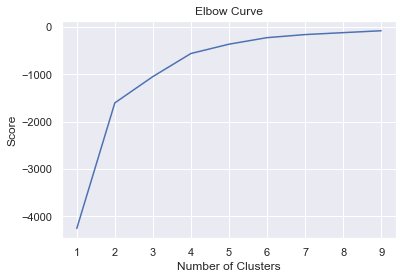

In [58]:
K_clusters = range(1,10)
kmeans = [KMeans(n_clusters=i) for i in K_clusters]
Y_axis = top_250[['Latitude']]
X_axis = top_250[['Longitude']]
score = [kmeans[i].fit(Y_axis).score(Y_axis) for i in range(len(kmeans))]
# Visualize
plt.plot(K_clusters, score)
plt.xlabel('Number of Clusters')
plt.ylabel('Score')
plt.title('Elbow Curve')
plt.show()

###  Elbow appers to be at 4 clusters

In [60]:
us_map = folium.Map(location=[latitude, longitude], zoom_start=10)


for latitude, longitude, zipcode in zip(X['Latitude'], X['Longitude'], X['ZIPCode']):
    label = '{}'.format(zipcode)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [latitude, longitude],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(us_map)  
    
us_map

### Add Cluster Labels to Lats/Longs Dataframe, with 4 clusters from the elbow above

In [65]:
kclusters = 4
kmeans = KMeans(n_clusters=kclusters, init ='k-means++')
kmeans.fit(X[X.columns[1:3]]) 
X['Cluster Labels'] = kmeans.fit_predict(X[X.columns[1:3]])
centers = kmeans.cluster_centers_ 
labels = kmeans.predict(X[X.columns[1:3]]) 
X

,ZIPCode,Latitude,Longitude,Cluster Labels
16165,77831,30.773570,-95.950440,1
5981,66535,39.194421,-96.421300,1
6259,42082,36.915485,-88.520735,2
8857,39170,32.097065,-90.298610,2
10974,12070,42.956700,-74.232600,0
5081,62544,39.709665,-89.000410,2
4924,61742,40.631345,-89.276435,2
14244,18328,41.257760,-74.911027,0
4878,61517,40.839775,-89.886185,2
12920,45380,40.222235,-84.484390,2


### Map the clusters of US Zip Codes

In [66]:
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(X['Latitude'], X['Longitude'], X['ZIPCode'], X['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters